In [1]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport

# Dataset
The dataset used in this example consists of a sample of meteorological data from Brazilian stations collected from 2018 to 2021, the original span from 2000 to 2021, and is available on [Kaggle](https://www.kaggle.com/datasets/saraivaufc/automatic-weather-stations-brazil). The raw data is available at [INMET](https://portal.inmet.gov.br/) meteorological database.
For reference, the filters used for the sample were:



In [2]:
def preprocessing(df, max_stations=5, output_path="inmet_2018_2021.csv"):
    stations = df["ESTACAO"].unique()[:max_stations]

    df = df[df["ESTACAO"].isin(stations)]
    df = df[df["DATA (YYYY-MM-DD)"] >= "2018-01-01"]
    df = df.replace(-9999, np.nan)
    df.to_csv(output_path, index=False)
    return df


In [3]:
df = pd.read_csv("inmet_2018_2021.csv", index_col=[0])
df.head()

,ESTACAO,DATA (YYYY-MM-DD),HORA (UTC),PRECIPITACAO TOTAL HORARIO (mm),"PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO, HORARIA (mB)",PRESSAO ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB),PRESSAO ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB),RADIACAO GLOBAL (W/m2),"TEMPERATURA DO AR - BULBO SECO, HORARIA (C)",TEMPERATURA DO PONTO DE ORVALHO (C),TEMPERATURA MAXIMA NA HORA ANT. (AUT) (C),TEMPERATURA MINIMA NA HORA ANT. (AUT) (C),TEMPERATURA ORVALHO MAX. NA HORA ANT. (AUT) (C),TEMPERATURA ORVALHO MIN. NA HORA ANT. (AUT) (C),UMIDADE REL. MAX. NA HORA ANT. (AUT) (%),UMIDADE REL. MIN. NA HORA ANT. (AUT) (%),"UMIDADE RELATIVA DO AR, HORARIA (%)","VENTO, DIRECAO HORARIA (gr)","VENTO, RAJADA MAXIMA (m/s)","VENTO, VELOCIDADE HORARIA (m/s)"
0,A001,2021-01-01,0,0.0,887.1,887.1,886.3,NaN,20.9,15.9,22.4,20.8,16.5,15.4,75.0,67.0,73.0,327.0,3.6,0.8
1,A001,2021-01-01,100,0.0,887.3,887.5,887.1,NaN,20.5,16.4,21.1,19.5,16.9,16.0,83.0,73.0,78.0,134.0,2.3,1.5
2,A001,2021-01-01,200,0.0,887.9,888.0,887.2,NaN,19.6,16.1,21.4,19.6,16.5,15.9,80.0,73.0,80.0,309.0,2.5,1.1
3,A001,2021-01-01,300,0.0,887.6,888.0,887.6,NaN,19.4,16.7,20.1,19.3,17.0,16.1,86.0,78.0,84.0,315.0,2.3,0.6
4,A001,2021-01-01,400,0.0,887.0,887.6,887.0,NaN,18.7,16.3,19.4,18.6,16.8,16.0,86.0,83.0,86.0,270.0,1.4,0.7


The support to time series can be enabled by passing the parameter tsmode=True to the ProfileReport when its enabled, pandas profiling will try to identify time-dependent features using the feature's autocorrelation, which requires a sorted DataFrame or the definition of the `sortby` parameter.

When a feature is identified as time series will trigger the following changes:
   - the histogram will be replaced by a line plot
   - the feature details will have a new tab with autocorrelation and partial autocorrelation plots
   - two new warnings: `NON STATIONARY` and `SEASONAL` (which indicates that the series may have seasonality)

In cases where the data has multiple entities,  as in this example, where we have different meteorological stations, each station can be interpreted as a time series, its necessary to filter the entities and profile each station separately.

In [4]:
df["ESTACAO"].unique()

array(['A001', 'A042', 'A045', 'A046', 'A047'], dtype=object)

The following plot showcases the amount of data for each entity over time. In this case the data from the stations started being collected at the same period, and the data is collected hourly so they have the same amount of data per period.

<AxesSubplot:xlabel='Time'>

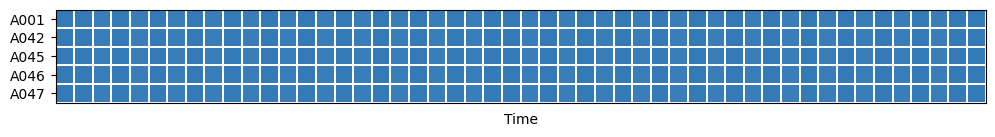

In [5]:
from pandas_profiling.visualisation.plot import timeseries_heatmap

timeseries_heatmap(df, "ESTACAO", "DATA (YYYY-MM-DD)")

To illustrate, this is an example of sequences that occurs in diffent periods

<AxesSubplot:xlabel='Time'>

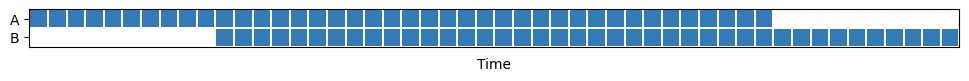

In [6]:
example = pd.DataFrame({
    "time": list(range(80)) + list(range(20, 100)),
    "entity": ["A"]*80 + ["B"]*80,
})
timeseries_heatmap(example, entity_column="entity", sortby="time")

In [7]:
def profile_station(station: str):
    profile = ProfileReport(
        df[df["ESTACAO"] == station],
        tsmode=True,
        sortby=["DATA (YYYY-MM-DD)", "HORA (UTC)"],
    )
    return profile.to_notebook_iframe()

In [8]:
profile_station('A001')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
profile_station('A042')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]